### 1) Load the necessary packages

In [16]:
import os
import sys
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

sys.path.append('./src/')
from Model import *

### 2) Load the model `FCR_EFM2`
This model is a full column rank model with two EFMs.

In [2]:
model = load_model("FCR_EFM2")

### 3) Generate random initial solutions

In [34]:
model.random_solutions.clear()
model.generate_random_initial_solutions(condition="1", nb_solutions=1000, max_trials=100000, min_mu=1e-10)

>  0  solutions was found after  39  trials
>  1  solutions was found after  227  trials
>  2  solutions was found after  323  trials
>  3  solutions was found after  379  trials
>  4  solutions was found after  425  trials
>  5  solutions was found after  525  trials
>  6  solutions was found after  634  trials
>  7  solutions was found after  664  trials
>  8  solutions was found after  829  trials
>  9  solutions was found after  1095  trials
>  10  solutions was found after  1287  trials
>  11  solutions was found after  1345  trials
>  12  solutions was found after  1383  trials
>  13  solutions was found after  1428  trials
>  14  solutions was found after  1587  trials
>  15  solutions was found after  1890  trials
>  16  solutions was found after  1912  trials
>  17  solutions was found after  1943  trials
>  18  solutions was found after  1956  trials
>  19  solutions was found after  2028  trials
>  20  solutions was found after  2063  trials
>  21  solutions was found after 

In [36]:
os.system("cp -r ./csv_models/FCR_EFM2 ../GBA_Evolution_2/csv_models/FCR_EFM2")

0

In [35]:
import plotly.express as px 
  
df = px.data.iris() 
  
fig = px.scatter_3d(model.random_data,
                    x = 'rxn3',  
                    y = 'rxn4',  
                    z = 'mu')
fig.update_traces(marker_size = 1)
fig.show()

In [4]:
model.clear_mean_evolutionary_trajectory()
for i in range(1, 11):
    model.set_f0(model.random_solutions[i])
    model.mean_evolutionary_trajectory(condition="1", max_time=20.0, track=True, label=i)

> Condition 1: MAXTIME reached
> Condition 1: MAXTIME reached


KeyboardInterrupt: 

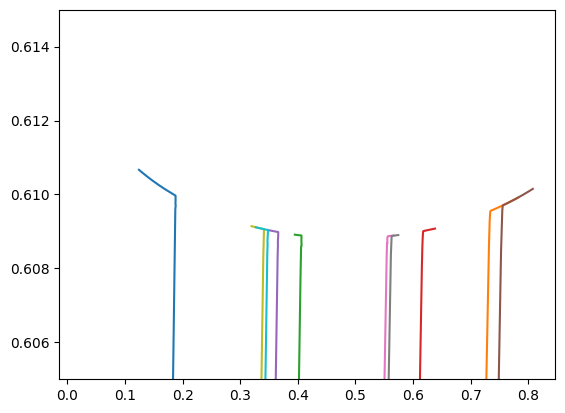

In [19]:
for label in model.mean_evolutionary_tracker["label"].unique():
    df = model.mean_evolutionary_tracker.loc[model.mean_evolutionary_tracker["label"] == label]
    plt.plot(df["rxn3"], df["mu"])
    plt.ylim(0.605, 0.615)
    #plt.xscale("log")
    #plt.yscale("log")


In [18]:
fig = go.Figure(data=go.Scatter3d(
    x=model.mean_evolutionary_tracker["rxn3"],
    y=model.mean_evolutionary_tracker["rxn4"],
    z=model.mean_evolutionary_tracker["mu"],
    marker=dict(
        size=4,
        color=model.mean_evolutionary_tracker["mu"],
        colorscale='Viridis',
    )
))
fig.show()